# Main


In [4]:
import numpy as np
import pandas as pd

from scipy.optimize import curve_fit
import statsmodels.api as sm # to build a LOWESS model
lowess = sm.nonparametric.lowess
from scipy import stats
from bokeh.io import export_png

import datashader as ds
import datashader.transfer_functions as tf
from holoviews import opts
from holoviews.operation.datashader import datashade
import holoviews.operation.datashader as hd
from bokeh.models import Slope
from bokeh.plotting import figure, output_file, show
from bokeh.io import export_svgs
from bokeh.io import export_png
import holoviews as hv

hv.extension('bokeh')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
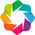

In [6]:
result=pd.read_csv("microbes_result_combined.csv", sep="\t")

In [9]:
baselines=pd.read_csv("all_baselines.tbl",sep="\t",header=None)

baselines.columns= ["short_tax_1", "short_tax_2", "median","5percentile","25percentile","75percentile","95percentile","mean","nrdist"]



baselines=baselines.astype({"short_tax_1" :str, "short_tax_2" :str, "median":float,"5percentile":float,"25percentile":float,"75percentile":float,"95percentile":float,"mean":float,"nrdist":float})


In [18]:
#Environment plot, 4a

result=result.astype({"short_tax_1" :str, "short_tax_2" :str, "median":float,"5percentile":float,"25percentile":float,"75percentile":float,"95percentile":float,"mean":float,"nrdist":float,"tax_long_1":str, "tax_long_2":str, "phydist":float, "env":int, "seqid":float, "shared_samples":float, "seqid":float, "baseline_val":float})



#For Environment difference

dfdf=pd.DataFrame(columns=["Distance", "BrayCurtis"],dtype="object")
dfdf["Distance"]=result["phydist"]
dfdf["BrayCurtis"]=result["mean"]
dfdf["env"]=result["env"]
dfdf



#split the pairs if they share the same enviornment (1) or if they have different main enviornments (0)

p = figure(plot_width=600, plot_height=600, x_range=(0,dfdf["Distance"].max()), y_range=(0,dfdf["BrayCurtis"].max()))
dfdf_1=dfdf[dfdf["env"]==1]
dfdf_2=dfdf[dfdf["env"]==0]


p.circle(dfdf_1["Distance"], dfdf_1["BrayCurtis"], size=0.5, color="#45818e")
p.circle(dfdf_2["Distance"], dfdf_2["BrayCurtis"], size=0.5, color="#ed9121")


#slope = Slope(gradient=gradient, y_intercept=y_intercept,
#              line_color='orange', line_dash='dashed', line_width=1.5)

x=dfdf["Distance"]
y=dfdf["BrayCurtis"]


###LOWESS Fit:

lowess = sm.nonparametric.lowess


#Fit the data to lowess model. Frac is indicating how sharp the curvwe changes, the smaller the value (standard: 2/3), the fast the change. 

y_hat2 = lowess(y, x, frac=1/5)


p.circle(y_hat2[:,0], y_hat2[:,1], color="blue", size=0.5)

#If we want to add as baseline here:



#x2=np.linspace(0, max(x), num=200).tolist()
#y2=200*[(result["baseline_val"].mean())]

#p.circle(x2, y2, color="red", size=0.5)

#Label axes

p.yaxis.axis_label = 'BrayCurtis Similarity (Mean)'
p.xaxis.axis_label = 'Phylogenetic Distance'


#show the plot in bokeh, or alternatively export it as svg or png
show(p)
#p.output_backend = "svg"
#export_svgs("plots/microbes_env_newcol2.svg")
#export_png(p,filename=savepath+taxname+"/plots/"+taxname+"_env.png")


y=-0.024979x+(0.060456)
y = -0.31658 * x + 0.54407 * x^2 + -0.49019


In [19]:
imp_col=result.columns[2:8]

In [22]:
baselines

,short_tax_1,short_tax_2,median,5percentile,25percentile,75percentile,95percentile,mean,nrdist
0,soil1,soil2,0.015459,0.0,0.000000,0.088548,0.234567,0.056691,1.593977e+09
1,plant1,plant2,0.005062,0.0,0.000000,0.055833,0.189906,0.040468,1.592428e+09
2,animal1,animal2,0.013317,0.0,0.001592,0.061578,0.173680,0.042592,1.594680e+09
3,marine1,marine2,0.007596,0.0,0.000000,0.032783,0.123891,0.027058,1.583458e+09
4,freshwater1,freshwater2,0.011948,0.0,0.000820,0.046968,0.143427,0.034030,1.586269e+09
5,general1,general2,0.002721,0.0,0.000074,0.019456,0.117530,0.022174,2.497065e+09
6,animal1,marine1,0.000176,0.0,0.000000,0.001426,0.013640,0.002884,1.599615e+09
7,animal1,freshwater1,0.000965,0.0,0.000056,0.005376,0.043179,0.008156,1.599667e+09
8,animal1,general1,0.004040,0.0,0.000250,0.029039,0.137987,0.027581,1.996522e+09
9,animal1,soil1,0.000883,0.0,0.000000,0.005960,0.045530,0.008580,1.599878e+09


In [24]:
#For Taxonomy difference
for h in imp_col:
    dfdf=pd.DataFrame(columns=["Distance", "BrayCurtis"],dtype="object")
    dfdf["Distance"]=result["phydist"]
    dfdf["BrayCurtis"]=result[h]
    dfdf["tax"]=result["tax"]
    dfdf


    p = figure(plot_width=600, plot_height=600, x_range=(0,dfdf["Distance"].max()), y_range=(0,dfdf["BrayCurtis"].max()))

    #Split up the pairs depending on their latest shared taxonomy: from species (purple to kingdom (grey)

    dfdf_5=dfdf[dfdf["tax"]==5]
    dfdf_4=dfdf[dfdf["tax"]==4]
    dfdf_3=dfdf[dfdf["tax"]==3]
    dfdf_2=dfdf[dfdf["tax"]==2]
    dfdf_1=dfdf[dfdf["tax"]==1]
    dfdf_0=dfdf[dfdf["tax"].isnull()]


    p.circle(dfdf_5["Distance"], dfdf_5["BrayCurtis"], size=1, color="purple")
    p.circle(dfdf_4["Distance"], dfdf_4["BrayCurtis"], size=1, color="green")
    p.circle(dfdf_3["Distance"], dfdf_3["BrayCurtis"], size=1, color="red")
    p.circle(dfdf_2["Distance"], dfdf_2["BrayCurtis"], size=1, color="orange")
    p.circle(dfdf_1["Distance"], dfdf_1["BrayCurtis"], size=1, color="black")
    p.circle(dfdf_0["Distance"], dfdf_0["BrayCurtis"], size=1, color="grey")

    slope = Slope(gradient=gradient, y_intercept=y_intercept,
                  line_color='orange', line_dash='dashed', line_width=1.5)

    #p.add_layout(slope)
    x=dfdf["Distance"]
    y=dfdf["BrayCurtis"]



    y_hat2 = lowess(y, x, frac=1/5)


    p.circle(y_hat2[:,0], y_hat2[:,1], color="blue", size=0.5)

    #add baseline similarity to mean
    if h=="mean":
        x2=np.linspace(0, max(x), num=200).tolist()
        y2=200*[(result["baseline_val"].mean())]



        p.circle(x2, y2, color="red", size=0.5)
        
        
    #label 

    p.yaxis.axis_label = "BrayCurtis Similarity ("+str(h)+")"
    p.xaxis.axis_label = 'Phylogenetic Distance'

    #show plot or save alternatively as png or svg
    
    show(p)
    #p.output_backend = "svg"
    #export_svgs(p, filename=savepath+taxname+"/plots/"+taxname+"_tax_"+str(h)+"_v2.svg")
    #export_png(p, filename=savepath+taxname+"/plots/"+taxname+"_tax_"+str(h)+".png")